Code review conducted on 2022/08/23 on Jupyter notebook 6.4.12 in python 3.9.12 with the following packages additionally installed:
pandas 1.4.3
numpy 1.23.1
pyarrow 8.0.0
kaleido 0.2.1
plotly 5.9
nltk 3.7
pyLDAvis 3.3.1


In [1]:
import pandas as pd
import os
from os.path import join
import numpy as np
import pyarrow.feather as feather

In [2]:
import plotly.express as px

In [3]:
# let the script know where your data will be stored relative to this Jupyter Notebook
data_path = "Verkehrswende_combined_hashtagsync"

The first sections of this script relate to Twitter data, the remaining attached sections deal with numerical table data.

# Frequency: Time Series
Define a fuction to be able to eplore a twitter dataset in a csv-file

In [4]:
def get_tweet_frequency(src, filename): #date_cutoff=pd.to_datetime('2011-06-15')):
    # takes one csv shows most tweeted day, total tweets
    data = pd.read_csv(join(src, '{}.csv'.format(filename)), low_memory=True)
    print('{}: {} Tweets'.format(filename, len(data)))
    data['created_at'] = pd.to_datetime(data['created_at'])
    data['created_at_date'] = data['created_at'].dt.date
    #data = data[data['created_at_date'] >= date_cutoff]
    
    frequency = data[['created_at_date', 'id']]\
        .groupby('created_at_date')\
        .agg('count')\
        .rename(columns={'id':'tweet_count'})
    
    return frequency

# 9-Euro-Ticket

In [8]:
# read 9-Euro-Ticket data into pandas dataframe
df = pd.read_csv(join(data_path, '9euroticket.csv'), low_memory=False)

## Genereal frequencies
First step is checking the data, seeing how many tweets we have, and when the most tweeted day was, to explore the data.

In [9]:
frequency = get_tweet_frequency(data_path, "9euroticket")
frequency.loc[frequency['tweet_count'].idxmax()]

C:\Users\chhor\AppData\Local\Temp\ipykernel_8716\2892344510.py:3: DtypeWarning: Columns (31,37,41,42,55,86,87,88,89) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(join(src, '{}.csv'.format(filename)), low_memory=True)


9euroticket: 351999 Tweets


tweet_count    19227
Name: 2022-06-05, dtype: int64

## First exploration
To first explore the data I generated a graph showing when the tweets were tweeted.

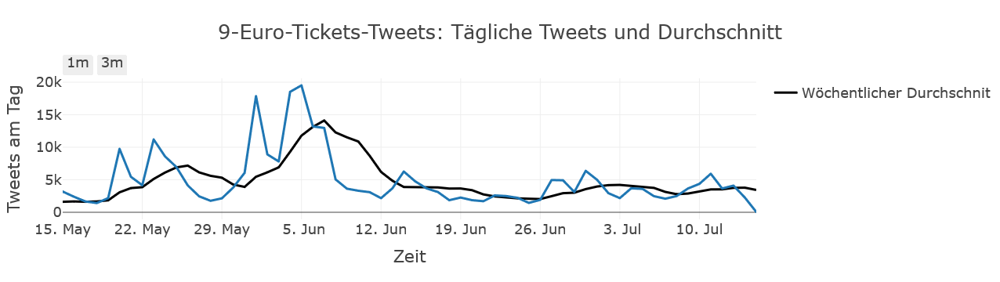

In [12]:
# Generate graph
df['dates'] = pd.to_datetime(df['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# Set cut_off
#date_cutoff = pd.to_datetime('2011-01-01')
df_ = df[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
#filter_bahn = filter_bahn[filter_bahn['dates'] >= date_cutoff]
df_ = df_.rename(columns={'conversation_id':'count'})

df_['count_7'] = df_['count'].rolling(7).mean()

# print(df) # Show example output

fig = px.line(
    df_, 
    x='dates', 
    y='count',
    labels={'dates': 'Zeit', 'count': 'Tweets am Tag'},
    range_x=["2022-05-15", "2022-07-15"], # This is the default start zoom
    title='9-Euro-Tickets-Tweets: Tägliche Tweets und Durchschnitt', 
    template='presentation'
)

fig.add_scatter(x=df_['dates'], y=df_['count_7'], line=dict(color='black', width=3), name='Wöchentlicher Durchschnitt') 

fig.update_xaxes(
    rangeslider_visible=False, # Enable slider
    tickformatstops = [
        dict(dtickrange=[None, 1000], value="%H:%M:%S.%L ms"),
        dict(dtickrange=[1000, 60000], value="%H:%M:%S s"),
        dict(dtickrange=[60000, 3600000], value="%H:%M m"),
        dict(dtickrange=[3600000, 86400000], value="%H:%M h"),
        dict(dtickrange=[86400000, 604800000], value="%e. %b"),
        dict(dtickrange=[604800000, "M1"], value="%e. %b"),
        dict(dtickrange=["M1", "M12"], value="%b '%y"),
        dict(dtickrange=["M12", None], value="%Y")
    ],
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=3, label="3m", step="month", stepmode="backward"),
            #dict(count=1, label="YTD", step="year", stepmode="todate"),
            #dict(count=1, label="1y", step="year", stepmode="backward"),
            #dict(count=3, label="3y", step="year", stepmode="backward"),
            #dict(step="all")
        ])
    )
)

fig.show()

## Party-wise viz

The idea is to select tweets by party affiliation (through the bio) and sort by time and something else. I tried sentiment analysis, which however is highly problematic and inaccurate.

## Mapping

In [42]:
# Removing duplicate tweets
df = df.drop_duplicates(subset=['text'], keep='first')

In [43]:
#df = df_concat.copy()

df = df[df['text'].str.contains('(?i)9euroticket|9EuroTicket|9-Euro-Ticket|9-Euroticket|Neun-Euro-Ticket|Neuneuroticket|9€-Ticket', na=False)] # Making sure the topic is in there

# Excluding parameters to not get anti-party users
df = df[~df['author.description'].str.contains("nofdp", na=False)]
df = df[~df['author.description'].str.contains("Skandale", na=False)]
df = df[~df['author.description'].str.contains("nocdu", na=False)]

# Creating the masks with regex. The excluding parameters are obsolete but do not harm
masks = [df['author.description'].str.lower().str.contains('(?i)grüne\s|grüne-|die_gruene|die_grünen|gruenen|bündnis\s90|die\sgrünen|die_gruenen', regex=True, na=False),
        df['author.description'].str.lower().str.contains('(?i)(?i)^((?!nofdp|noafdp).)$|fdp\s|fdp-|fdpbt|freie\sdemokraten|freien\sdemokraten', regex=True, na=False),
        df['author.description'].str.lower().str.contains('(?i)^((?!nocdu|Skandale).)$|(\scdu\s|cdu-|union-|\sunion\s|christlich\s|christliche\s|CDUCSUBT|csu)', regex=True, na=False),
        df['author.description'].str.lower().str.contains('(?i)spd\s|spd-|sozialdemokrat-|sozialdemokrat\s|sozialdemokratie\s|sozialdemokraten|\ssozi\s|\ssoze\s', regex=True, na=False),
        df['author.description'].str.lower().str.contains('(?i)Linkspartei|Die\sLinke', regex=True, na=False),
]

values = [
    'Grüne',
    'FDP',
    'CDU',
    'SPD',
    'Linke'
]

df['party'] = np.select(masks, values, default='Unknown')
df = df[df["party"].str.contains("Unknown") == False]

C:\Users\Laser\AppData\Local\Temp\ipykernel_22264\161627819.py:12: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.

C:\Users\Laser\AppData\Local\Temp\ipykernel_22264\161627819.py:13: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



In [40]:
#df['party']

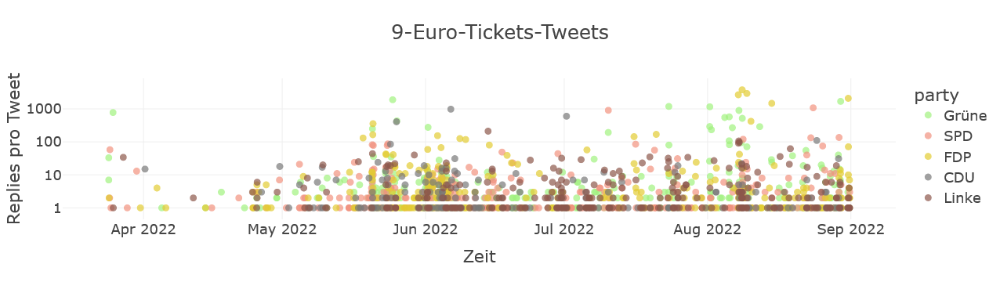

In [44]:
# Generate graph

df['dates'] = pd.to_datetime(df['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

#df_ = df_fdp.copy()
#df_['dates'] = pd.to_datetime(df_['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

#df_g = df_grüne.copy()
#df_g['dates'] = pd.to_datetime(df_g['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# print(df) # Show example output

fig = px.scatter(
    df, 
    x='dates', 
    y='public_metrics.reply_count',
    labels={'dates': 'Zeit', 'public_metrics.reply_count': 'Replies pro Tweet'},
    #range_x=["2022-05-15", "2022-09-01"], # This is the default start zoom
    title='9-Euro-Tickets-Tweets', 
    color = 'party',
    template='presentation',
    log_y=True,
    hover_name='text',
    color_discrete_map=
    {'Grüne': '#A0F07E', 'FDP': '#E2CB31', 'CDU': '#777777', 'SPD': '#F0917E', 'LINKE' : ''},
    opacity=0.7
)


fig.show()

In [45]:
import kaleido
import plotly
import plotly.io as pio
#pio.write_html(fig, file="../plots/Verkehrswende/timeline_9euroticket_party_UPDATE.html", auto_open=False)
pio.write_image(fig, file="../plots/Verkehrswende/timeline_9euroticket_parteien.png", width=1500, height=775, engine="kaleido", scale = 2.5)

# Verkehrswende bis 2022

In [17]:
# read compiled Verkehrswende data into pandas dataframe
df = pd.read_csv(join(data_path, 'Verkehrswende_combined_hashtagsync.csv'), low_memory=False)

## Check the new data set

Below are multiple graphs that test the frequencies. The joint graph is the final graph for publication.

In [18]:
frequency = get_tweet_frequency(data_path, "Verkehrswende_combined_hashtagsync")
frequency.loc[frequency['tweet_count'].idxmax()]

C:\Users\chhor\AppData\Local\Temp\ipykernel_8716\2892344510.py:3: DtypeWarning:

Columns (8,11,28,29,35,39,40,53,82,83,84) have mixed types. Specify dtype option on import or set low_memory=False.



Verkehrswende_combined_hashtagsync: 483970 Tweets


tweet_count    1182
Name: 2021-11-24, dtype: int64

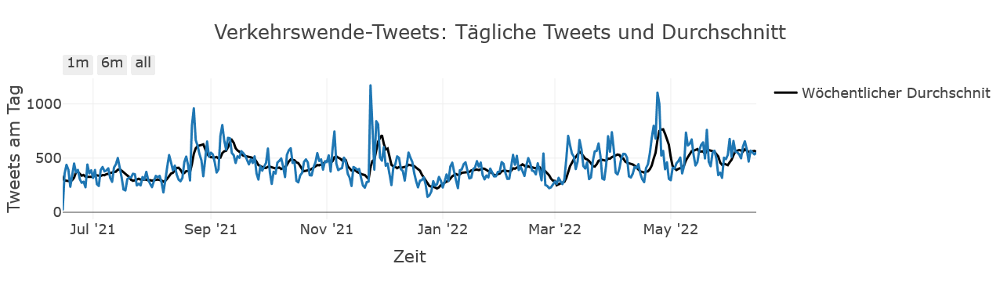

In [19]:
# Generate graph
df['dates'] = pd.to_datetime(df['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# Set cut_off
#date_cutoff = pd.to_datetime('2011-01-01')
df_ = df[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
#filter_bahn = filter_bahn[filter_bahn['dates'] >= date_cutoff]
df_ = df_.rename(columns={'conversation_id':'count'})

df_['count_7'] = df_['count'].rolling(7).mean()

# print(df) # Show example output

fig = px.line(
    df_, 
    x='dates', 
    y='count',
    labels={'dates': 'Zeit', 'count': 'Tweets am Tag'},
    range_x=["2021-06-15", "2022-06-15"], # This is the default start zoom
    title='Verkehrswende-Tweets: Tägliche Tweets und Durchschnitt', 
    template='presentation'
)

fig.add_scatter(x=df_['dates'], y=df_['count_7'], line=dict(color='black', width=3), name='Wöchentlicher Durchschnitt') 

fig.update_xaxes(
    rangeslider_visible=False, # Enable slider
    tickformatstops = [
        dict(dtickrange=[None, 1000], value="%H:%M:%S.%L ms"),
        dict(dtickrange=[1000, 60000], value="%H:%M:%S s"),
        dict(dtickrange=[60000, 3600000], value="%H:%M m"),
        dict(dtickrange=[3600000, 86400000], value="%H:%M h"),
        dict(dtickrange=[86400000, 604800000], value="%e. %b"),
        dict(dtickrange=[604800000, "M1"], value="%e. %b"),
        dict(dtickrange=["M1", "M12"], value="%b '%y"),
        dict(dtickrange=["M12", None], value="%Y")
    ],
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            #dict(count=1, label="YTD", step="year", stepmode="todate"),
            #dict(count=1, label="1y", step="year", stepmode="backward"),
            #dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.show()

## Produce joint graph

In [20]:
# Generate graph
df['dates'] = pd.to_datetime(df['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# Set cut_off
#date_cutoff = pd.to_datetime('2011-01-01')
df_ = df[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
#filter_bahn = filter_bahn[filter_bahn['dates'] >= date_cutoff]
df_ = df_.rename(columns={'conversation_id':'count'})

df_['count_7'] = df_['count'].rolling(7).mean()

# print(df) # Show example output

fig = px.line(
    #df_, 
    #x='dates', 
    #y='count',
    labels={'dates': 'Zeit', 'count': 'Tweets am Tag'},
    range_x=["2021-11-21", "2022-04-25"], # This is the default start zoom
    title='"Verkehrswende": Tweets im Wochendurchschnitt', 
    template='presentation'
)

fig.add_scatter(x=df_['dates'], y=df_['count_7'], line=dict(color='black', width=3), name='Wöchentlicher Durchschnitt') 

fig.update_xaxes(
    rangeslider_visible=True, # Enable slider
    tickformatstops = [
        dict(dtickrange=[None, 1000], value="%H:%M:%S.%L ms"),
        dict(dtickrange=[1000, 60000], value="%H:%M:%S s"),
        dict(dtickrange=[60000, 3600000], value="%H:%M m"),
        dict(dtickrange=[3600000, 86400000], value="%H:%M h"),
        dict(dtickrange=[86400000, 604800000], value="%e. %b"),
        dict(dtickrange=[604800000, "M1"], value="%e. %b"),
        dict(dtickrange=["M1", "M12"], value="%b '%y"),
        dict(dtickrange=["M12", None], value="%Y")
    ],
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=3, label="3m", step="month", stepmode="backward"),
            #dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.add_annotation(x=2, y=5,
            text="Text annotation with arrow",
            showarrow=True,
            arrowhead=1)

fig.show()

In [21]:
# Generate final graph
df = df.sort_values(by=['created_at'])
df['dates'] = pd.to_datetime(df['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# Set cut_off
#date_cutoff = pd.to_datetime('2011-01-01')
df_ = df[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
#filter_bahn = filter_bahn[filter_bahn['dates'] >= date_cutoff]
df_ = df_.rename(columns={'conversation_id':'count'})

df_['count_7'] = df_['count'].rolling(7).mean()

# print(df) # Show example output

fig = px.line(
    #df_, 
    #x='dates', 
    #y='count',
    labels={'dates': 'Zeit', 'count': 'Tweets am Tag'},
    range_x=["2015-06-01", "2022-06-15"], # This is the default start zoom
    title='"Verkehrswende": Tweets im Wochendurchschnitt (N = 351.999)', 
    template='presentation',
    #log_y=True
)
fig.add_scatter(x=df_['dates'], y=df_['count_7'], line=dict(color='black', width=3), name='Wöchentlicher Durchschnitt (N = 351.999)') 

fig.show()

In [22]:
import kaleido
import plotly
import plotly.io as pio
pio.write_image(fig, file=os.path.join(data_path, 'timeline_2022.png'), width=1500, height=775, engine="kaleido")

In [23]:
pio.write_html(fig, file=os.path.join(data_path, 'Verkehrswende_timeseries_updated_nur_Durchschnitt.html'), auto_open=False)

## Sort dataset by themes

In [24]:
df['text']

0         gesellschaft und so: autos und kraftstoffe sin...
1                                                       Mit
2         #Eurobike: 1020 Firmen aus 42 Ländern sind zur...
3         Warum hab ich das #Auto nochmal zurück gegeben...
4         RT @alexbonde: Grüne Bundestagsfraktion beantr...
                                ...                        
483965    @SaxGruen @gerbsen Der Zusammenhang macht doch...
483966    Stadtbahn auch in Landshut möglich – eine Dele...
483967    Ein Hintergrund vom @dlf über Lieferlogistik i...
483968    @VDV_Verband Das ist das Ende der Verkehrswend...
483969    das 9€ ticket hat gezeigt was möglich wäre und...
Name: text, Length: 483970, dtype: object

## Create seperate dataframes for mobility forms

In [33]:
# create a subset of the dataframe containing keywords for train.
df_bahn = df[df['text'].str.contains('(?i)\sbahn|Bahn|DB\s|Güterverkehr|Güterverkehr|Schiene|schiene|Schienengüterverkehr|Fernverkehr|Nahverkehr|Cargo|Züge|Zug\s', na=False)] 

In [34]:
# create a subset of the dataframe containing keywords for electric vehicles
df_e = df[df['text'].str.contains('(?i)Elektromobilität|Elektroautos|Elektroauto|Elektroantrieb|EAuto|E-Auto|Emobilität|E-Mobilität|Elektromobil|Elektrofahrzeug', na=False)]

In [35]:
# create a subset of the dataframe containing keywords for bikes
df_rad = df[df['text'].str.contains('(?i)Radverkehr|Fahrradverkehr|Fahrradfahren|Fahrrad|Radfahren|radeln|\srad\s', na=False)]

In [36]:
# create a subset of the dataframe containing keywords for public transportation
df_oe = df[df['text'].str.contains('(?i)öpnv|oepnv|öffentlicher Personennahverkehr|oeffentlicher Personennahverkehr|Nahverkehr', na=False)]

In [29]:
### Der Code hier zerstört die dataframes df_bahn, df_e etc. Deshalb funktioniert die Analyse unter "Qualitative lense" nicht mehr ohne die dataframes neu zu erstellen. Wenn Du sie hier in andere kopierst, sollte das funktionieren. ###

# Prepare graphs
df_bahn = df_bahn.sort_values(by=['created_at'])
df_bahn['dates'] = pd.to_datetime(df_bahn['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

df_e = df_e.sort_values(by=['created_at'])
df_e['dates'] = pd.to_datetime(df_e['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

df_rad = df_rad.sort_values(by=['created_at'])
df_rad['dates'] = pd.to_datetime(df_rad['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

df_oe = df_oe.sort_values(by=['created_at'])
df_oe['dates'] = pd.to_datetime(df_oe['created_at'].astype('datetime64[ns]').dt.tz_localize('UTC').dt.tz_convert('Europe/Berlin').dt.tz_localize(None))

# Set cut_off
#date_cutoff = pd.to_datetime('2011-01-01')
df_bahn = df_bahn[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
df_e = df_e[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
df_rad = df_rad[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
df_oe = df_oe[['dates', 'conversation_id']].groupby([pd.Grouper(key='dates', freq='D')]).agg('count').reset_index()
#filter_bahn = filter_bahn[filter_bahn['dates'] >= date_cutoff]
df_bahn = df_bahn.rename(columns={'conversation_id':'count'})
df_e = df_e.rename(columns={'conversation_id':'count'})
df_rad = df_rad.rename(columns={'conversation_id':'count'})
df_oe = df_oe.rename(columns={'conversation_id':'count'})

#calculate weekly mean
df_bahn['count_7'] = df_bahn['count'].rolling(7).mean()
df_e['count_7'] = df_e['count'].rolling(7).mean()
df_rad['count_7'] = df_rad['count'].rolling(7).mean()
df_oe['count_7'] = df_oe['count'].rolling(7).mean()



In [30]:
# Generate graph
fig = px.line(
    #df_, 
    #x='dates', 
    #y='count',
    labels={'dates': 'Zeit', 'count': 'Tweets am Tag'},
    range_x=["2019-01-01", "2022-06-15"], # This is the default start zoom
    title='"Verkehrswende": Tweets im Wochendurchschnitt nach Mobilitätsform', 
    template='presentation',
    #log_y=True
)
# Add all lines
# Color palette via https://colorpalettes.net/color-palette-4533/
fig.add_scatter(x=df_bahn['dates'], y=df_bahn['count_7'], line=dict(color='#CB8A58', width=3), name='Bahn (N = 61.826)') 
fig.add_scatter(x=df_e['dates'], y=df_e['count_7'], line=dict(color='#B29F91', width=3), name='E-Mobilität (N = 23.370)')
fig.add_scatter(x=df_rad['dates'], y=df_rad['count_7'], line=dict(color='#562B1A', width=3), name='Radverkehr (N = 62.118)') 
fig.add_scatter(x=df_oe['dates'], y=df_oe['count_7'], line=dict(color='#627281', width=3), name='ÖPNV (N = 26.459)') 

fig.show()

In [31]:
import kaleido
import plotly
import plotly.io as pio
pio.write_image(fig, file=join(data_path, 'timeline_2022_split.png'), width=1500, height=775, engine="kaleido")

# Qualitative Lens

What are users engaging with? Based on the Twitter Api 2.0 rules, individual tweets cannot be shown.

In [ ]:
with pd.option_context('display.max_colwidth', None):
    display(df_bahn.sort_values(by='retweets', ascending=False)[['text', 'author.name', 'created_at', 'likes', 'retweets', 'foll_ratio', 'like_foll']].head(50).style.bar(subset=['likes'], color='lightgreen'))

Analysis via like_foll allows to find viral tweets of smaller accounts.

In [ ]:
with pd.option_context('display.max_colwidth', None):
    display(df_bahn.sort_values(by='like_foll', ascending=False)[['text', 'author.name', 'created_at', 'likes', 'retweets', 'foll_ratio', 'like_foll']].head(20).style.bar(subset=['likes'], color='lightgreen'))

To make topic topelling possible, you need to strip the text of all insignificant strips of words and make them as coherent as possible without losing quality. Key to this is a cleaning master function.

In [ ]:
import nltk
nltk.download('stopwords')

In [ ]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from numpy import nan

# alternative model building package
import sklearn
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV
# from sklearn.decomposition import NMF

# package to clean text
import re

# Load modules for cleaning tasks
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem.snowball import GermanStemmer

In [ ]:
df = pd.read_csv(data_path + os.sep + "Verkehrswende_bahn_compiled.csv", low_memory=False)

### Cleaning Master Function

In [ ]:
# Standard cleaning tasks

def remove_links(tweet):
    '''Takes a string and removes web links from it'''
    tweet = re.sub(r'http\S+', '', tweet) # remove http links
    tweet = re.sub(r'bit.ly/\S+', '', tweet) # remove bitly links
    tweet = tweet.strip('[link]') # remove [links]
    return tweet

def remove_users(tweet):
    '''Takes a string and removes retweet and @user information'''
    tweet = re.sub('RT @[\w_]+:', '', tweet) # remove retweet ## Alternatives: RT @[\w_]+: OR (RT\s@[A-Za-z]+[A-Za-z0-9-_]+)
    tweet = re.sub('@[A-Za-z0-9_]', '', tweet) # remove tweeted at ## Alternatives: @[A-Za-z0-9_]+ OR (@[A-Za-z]+[A-Za-z0-9-_]+)
    return tweet

my_stopwords = nltk.corpus.stopwords.words('german')
#word_rooter = nltk.stem.snowball.GermanStemmer(ignore_stopwords=False).stem
#word_rooter2 = nltk.stem.snowball.PorterStemmer(ignore_stopwords=False).stem
#my_punctuation = '!"$%&\'()*+,-./:;<=>?[\\]^_`{|}~•@' ## Alternatives: r'[^\w\s] OR !"$%&\'()*+,-./:;<=>?[\\]^_`{|}~•@ 

# cleaning master function
def clean_tweet(tweet, bigrams=False): # change bigrams to True to enable further analysis
    tweet = remove_users(tweet)
    tweet = remove_links(tweet)
    tweet = tweet.lower() # lower case
    tweet = re.sub(r'[^\w\s]', ' ', tweet) # strip punctuation
    tweet = re.sub(r'\b\w{1,3}\b', '', tweet, re.UNICODE)
    tweet = re.sub('\s+', ' ', tweet, re.UNICODE) # remove double spacing
    tweet = re.sub('([0-9]+)', '', tweet, re.UNICODE) # remove numbers
    tweet_token_list = [word for word in tweet.split(' ')
                            if word not in my_stopwords] # remove stopwords
    #tweet_token_list = [word_rooter(word) if '#' not in word else word 
    #                    for word in tweet_token_list] # apply word rooter
    #tweet_token_list = [word_rooter2(word) if '#' not in word else word 
    #                    for word in tweet_token_list] # apply word rooter
    if bigrams:
        tweet_token_list = tweet_token_list+[tweet_token_list[i]+'_'+tweet_token_list[i+1]
                                            for i in range(len(tweet_token_list)-1)]
    tweet = ' '.join(tweet_token_list)
    return tweet

### No filter
Proceed with the following cell or choose a filter below.

In [ ]:
df['text'] = df['text'].astype(str)
df['clean_tweet'] = df.text.apply(clean_tweet) # This gets cleaned tweets

#df['clean_tweet'] = df['clean_tweet'].apply(
#    lambda x: x.replace("test", "")) # Merge certain singular words

In [ ]:
df['clean_tweet'].head()

### Language-based filter
The following cell allows to set a filter on content only published in a certain language. Note that the "lang" column produced by Twitter might produce artefacts.

In [ ]:
# en = df[df['lang']=='en']
de = df[df['lang']=='de']

In [ ]:
# Test the results through uncommenting
# df
# en

#en['text'] = en['text'].astype(str)
#en['clean_tweet'] = en.text.apply(clean_tweet)
de['text'] = de['text'].astype(str)
de['clean_tweet'] = de.text.apply(clean_tweet)

## Topic Modelling

In [ ]:
# Dropping NA is only relevant for a focused analysis, with only a few columns available and hashtags at the centre of attention.
# en = en.dropna()
# df = df.dropna()

In [ ]:
#en

In [ ]:
# Add additional stopwords if necessary
de['clean_tweet'] = de['clean_tweet'].apply(
    lambda x: x.replace("verkehrswende", "")) # Merge certain singular words
de['clean_tweet'] = de['clean_tweet'].apply(
    lambda x: x.replace("mobilitätswende", "")) # Merge certain singular words

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# the vectorizer object will be used to transform text to vector form
vectorizer = CountVectorizer(#strip_accents = 'unicode',
                                stop_words = stopwords.words('german'), #stop_words = 'english', 
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.9, 
                                min_df = 25)

# apply transformation to get Matrix
tf = vectorizer.fit_transform(de['clean_tweet']) #.toarray() # Change between df OR a language filter
#tf = vectorizer.fit_transform(df.pop('text'))

# adding "features" columns as SparseSeries
#for i, col in enumerate(vectorizer.get_feature_names()):
#    df[col] = pd.SparseSeries(tf[:, i].toarray().ravel(), fill_value=0)

# tf_feature_names tells us what word each column in the matric represents
tf_feature_names = vectorizer.get_feature_names()

In [ ]:
#tf_feature_names # only for testing purposes

### Loop through number_of_topics to find the best number
The quality of the topic modelling hinges on the ideal number of topics. Thanks to [this website (although the code needs an update)](https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/#9buildldamodelwithsklearn).

In [ ]:
# Search for optimal topics
search_params = {'n_components': [2, 5, 10]} #, 'learning_decay': [.5, .7, .9]}
search = LatentDirichletAllocation()

search_model = GridSearchCV(search, param_grid=search_params)
search_model.fit(tf)

# Best Model
best_model = search_model.best_estimator_

# Model Parameters
print("Best Model's Params: ", search_model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", search_model.best_score_)

# Perplexity
print("Model Perplexity of the best topic: ", best_model.perplexity(tf))

In [ ]:
%%time

n_topics = [2, 5, 10]

#log_likelyhoods_5 = [round(search_model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(search_model.cv_results_['params']) if gscore['learning_decay']==0.5]
log_likelyhoods_7 = [round(search_model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(search_model.cv_results_['params'])]# if gscore['learning_decay']==0.7]
#log_likelyhoods_9 = [round(search_model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(search_model.cv_results_['params']) if gscore['learning_decay']==0.9]

# Show graph
plt.figure(figsize=(12, 8))
#plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
#plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing The Optimal LDA Model")
plt.xlabel("Num Topics")

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.ylabel("Log Likelyhood Scores")
#plt.legend(title='Learning decay', loc='best')
#plt.savefig('../plots/Verkehrswende/lda_model_test.png', dpi=300)
plt.show()

### Set topics and start the model

In [ ]:
%%time
# Set topics
number_of_topics = 3

# Here we have two different models: LDA vs NFM. NFM might work better with Tweet data.
model = LatentDirichletAllocation(n_components=number_of_topics, random_state=0)
#model = NMF(n_components=None, random_state=0, alpha=.1, l1_ratio=.5)
model.fit(tf)

#### Print results here and export a file with top results
Only run the following cell to get an export file

In [ ]:
# model.fit(tf)

def display_topics(model, feature_names, no_top_words):
    topic_dict = {}
    for topic_idx, topic in enumerate(model.components_):
        topic_dict["Topic %d words" % (topic_idx)]= ['{}'.format(feature_names[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
        topic_dict["Topic %d weights" % (topic_idx)]= ['{:.1f}'.format(topic[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
        df = pd.DataFrame(topic_dict)
        df.to_csv('../plots/Verkehrswende/' + '/' + 'topics_3.csv')
    return df


# Select top word list 
no_top_words = 20
display_topics(model, tf_feature_names, no_top_words)

## Interactive Topic Modelling
Thanks to [Himanshu](https://towardsdatascience.com/topic-model-visualization-using-pyldavis-fecd7c18fbf6)

5 Topics

In [ ]:
from __future__ import print_function
import pyLDAvis
import pyLDAvis.sklearn
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
pyLDAvis.enable_notebook()

#tf = np.matrix(tf) # Enable if .toarray a few cells above is turned on
pyLDAvis.sklearn.prepare(model, tf, vectorizer)

2 Topics

In [ ]:
from __future__ import print_function
import pyLDAvis
import pyLDAvis.sklearn
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
pyLDAvis.enable_notebook()

#tf = np.matrix(tf) # Enable if .toarray a few cells above is turned on
pyLDAvis.sklearn.prepare(model, tf, vectorizer)

Thus, the best result is produced by the LDA_5 model, even though it requires critical assessment.

In [ ]:
# Export the result to an html
pyLDAvis.save_html(pyLDAvis.sklearn.prepare(model, tf, vectorizer), 'lda_3.html') # The fill be saved in the active path: ../code

# Thread analysis

Assuming that key topics are introduced and explored via threads, what are the key themes?

In [ ]:
df_threads = df[df['text'].str.contains('(?i)thread', na=False)]

In [ ]:
with pd.option_context('display.max_colwidth', None):
    display(df_threads.sort_values(by='likes', ascending=False)[['text', 'author.name', 'created_at', 'likes', 'retweets', 'foll_ratio', 'like_foll']].head(100).style.bar(subset=['likes'], color='lightgreen'))

# Statistics Bundesumweltamt 
Data source:  https://www.umweltbundesamt.de/daten/verkehr/fahrleistungen-verkehrsaufwand-modal-split#guterverkehr

In [46]:
d = {'LKW': [72.4, 65.4], 'Eisenbahn': [18.0, 25], 'Schifffahrt': [6.9, 6.9], 'Rohrleitungen': [2.5, 2.5], 'Luft': [0.2, 0.5], 'Jahr': [2020, 2025]}

df = pd.DataFrame(data=d)

In [47]:
df_ = pd.melt(df, id_vars= ["Jahr"], value_vars=["LKW","Eisenbahn","Schifffahrt", "Rohrleitungen", "Luft"],
             var_name='Verkehrstyp', value_name='Anteil')

In [48]:
df_

,Jahr,Verkehrstyp,Anteil
0,2020,LKW,72.4
1,2025,LKW,65.4
2,2020,Eisenbahn,18.0
3,2025,Eisenbahn,25.0
4,2020,Schifffahrt,6.9
5,2025,Schifffahrt,6.9
6,2020,Rohrleitungen,2.5
7,2025,Rohrleitungen,2.5
8,2020,Luft,0.2
9,2025,Luft,0.5


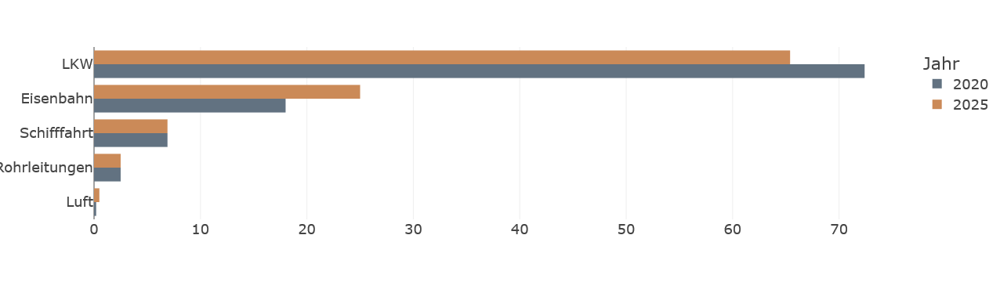

In [63]:
df_['Jahr'] = df_['Jahr'].astype(str)

fig = px.bar(df_, y='Verkehrstyp', x='Anteil',
            color = "Jahr",
            barmode='group',
            template='presentation',
            orientation='h',
            labels={'Anteil': '', 'Verkehrstyp': ''},
            color_discrete_map={
        '2020': '#627281',
        '2025': '#CB8A58'},
            )
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_layout(margin=dict(l=120))


fig.show()

In [64]:
import kaleido
import plotly
import plotly.io as pio
pio.write_image(fig, file="../Anteil_Modal_Split_Güter.png", engine="kaleido", scale = 2.5)

## Güterverkehr

In [2]:
import pandas as pd
import plotly.express as px

### Raw numerical data

In [101]:
df = pd.read_csv("../Dokumente/Allianz via Flege/7_abb_anteile-vt-gueterverkehr_02-08.csv", sep='.')

In [111]:
df = pd.read_csv("../Dokumente/Allianz via Flege/anteile-gueterverkehr_relativ.csv", sep='.')

In [115]:
df_ = pd.melt(df, id_vars= ["Güterabteilung", "Abkürzung"], value_vars=["Eisenbahn","Schifffahrt","LKW"],
             var_name='Verkehrsmittel', value_name='Anteil')

In [113]:
df_.to_csv("../Dokumente/Allianz via Flege/anteile-gueterverkehr_relativ_long.csv")

In [114]:
df.to_csv("../Dokumente/Allianz via Flege/anteile-gueterverkehr_relativ_wide.csv")

#### Relative data

In [162]:
# wide
df = pd.read_csv("../Dokumente/Allianz via Flege/anteile-gueterverkehr_relativ_wide.csv")

In [131]:
# long
df = pd.read_csv("../Dokumente/Allianz via Flege/anteile-gueterverkehr_relativ_long.csv")

Dropping some columns that are not of high value to the analysis

In [142]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      16 non-null     int64  
 1   Güterabteilung  16 non-null     object 
 2   Abkürzung       16 non-null     object 
 3   Eisenbahn       16 non-null     float64
 4   Schifffahrt     16 non-null     float64
 5   LKW             16 non-null     float64
 6   Unnamed: 5      0 non-null      float64
 7   Unnamed: 6      0 non-null      float64
 8   Unnamed: 7      0 non-null      float64
dtypes: float64(6), int64(1), object(2)
memory usage: 1.2+ KB


In [184]:
df['Eisenbahn'].astype(str).astype(float)

df_= df.sort_values(by = 
                   ['Eisenbahn'], ascending=True).reset_index()

df__= df.sort_values(by = 
                   ['LKW'], ascending=True).reset_index()

In [181]:
df_

,index,Unnamed: 0,Güterabteilung,Abkürzung,Eisenbahn,Schifffahrt,LKW,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,15,15,"Post, Pakete",Post,0.000000,0.000000,5.381041,NaN,NaN,NaN
1,13,13,Umzugsgut und sonstige nicht­markt­bestimmte G...,Umzugsgut,0.001476,0.000000,2.741647,NaN,NaN,NaN
2,4,4,Textilien und Bekleidung; Leder und Lederwaren,Textil,0.004428,0.049186,0.428211,NaN,NaN,NaN
3,12,12,"Möbel, Schmuck, Musikinstrumente, Sportgeräte ...","Möbel, Instrumente, etc.",0.013283,0.082722,1.268962,NaN,NaN,NaN
4,10,10,"Maschinen und Ausrüstungen, Haushaltsgeräte et...","Maschinen, Haushalt",0.318782,0.742264,2.827838,NaN,NaN,NaN
5,3,3,Nahrungs- und Genussmittel,Nahrung,1.602763,4.777768,20.333166,NaN,NaN,NaN
6,14,14,"Sekundärrohstoffe, Abfälle",Abfälle,3.354585,6.492577,7.564408,NaN,NaN,NaN
7,8,8,"Sonstige Mineralerzeugnisse (Glas, Zement, Gip...",Mineralerzeugnisse,3.772248,1.828832,10.291168,NaN,NaN,NaN
8,0,0,Erzeugnisse der Land- und Forstwirtschaft sowi...,Landwirtschaft,5.910741,12.432928,7.797906,NaN,NaN,NaN
9,1,1,"Kohle, rohes Erdöl und Erdgas",Fossile Energie,8.083178,10.928278,0.313029,NaN,NaN,NaN


## Single plot

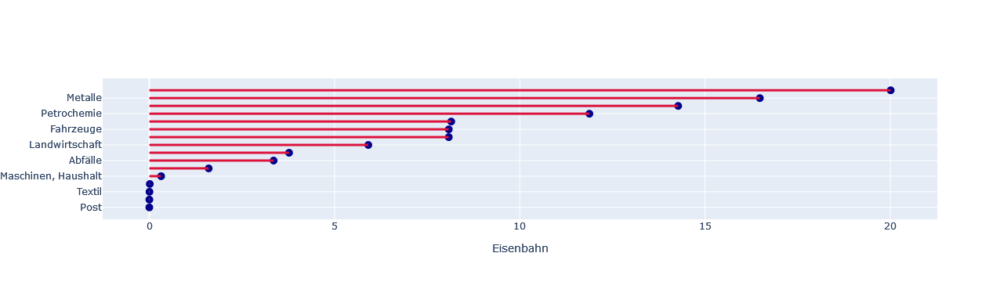

In [169]:
import plotly.graph_objects as go



# Draw points
fig1 = go.Figure()

fig1.add_trace(go.Scatter(x = df_["Eisenbahn"], 
                          y = df_["Abkürzung"],
                          mode = 'markers',
                          marker_color ='darkblue',
                          marker_size  = 10),)# Draw lines
for i in range(0, len(df_)):
               fig1.add_shape(type='line',
                              x0 = 0, y0 = i,
                              x1 = df_["Eisenbahn"][i],
                              y1 = i,
                              line=dict(color='crimson', width = 3))
        

fig1.update_xaxes(title = 'Eisenbahn' , range=[0, 25])
fig1.show()

## Small multiples

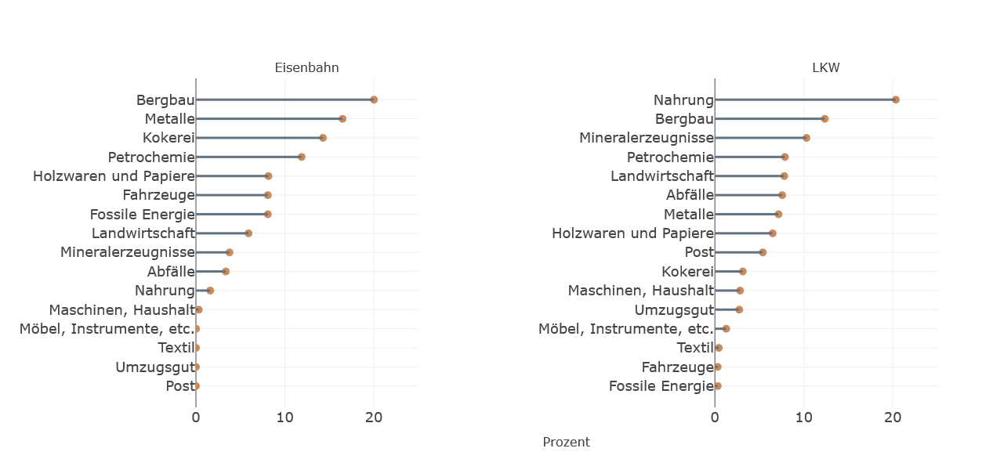

In [212]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Make subplot

fig = make_subplots(rows=1, cols=2,
                   subplot_titles=("Eisenbahn", "LKW"),
                   horizontal_spacing = 0.4,
                   x_title = "Prozent")

# Create Dots
fig.add_trace(go.Scatter(x = df_["Eisenbahn"], 
                          y = df_["Abkürzung"],
                          mode = 'markers',
                          marker_color ='#CB8A58',
                          marker_size  = 10),
                          row=1, col=1)

fig.add_trace(go.Scatter(x = df__["LKW"], 
                          y = df__["Abkürzung"],
                          mode = 'markers',
                          marker_color ='#CB8A58',
                          marker_size  = 10),
                          row=1, col=2)

# Draw lines
for i in range(0, len(df_)):
               fig.add_shape(type='line',
                              x0 = 0, y0 = i,
                              x1 = df_["Eisenbahn"][i],
                              y1 = i,
                              line=dict(color='#627281', width = 3),
                              row=1, col=1)
for i in range(0, len(df_)):
               fig.add_shape(type='line',
                              x0 = 0, y0 = i,
                              x1 = df__["LKW"][i],
                              y1 = i,
                              line=dict(color='#627281', width = 3),
                              row=1, col=2)        

fig.update_layout(height=600, width=800)        
fig.update_layout(showlegend=False)
fig.update_layout(template='presentation', margin=dict(l=250))
        
fig.update_xaxes(range=[0, 25])
fig.show()

In [219]:
import kaleido
import plotly
import plotly.io as pio
pio.write_image(fig, file="../Anteil_Güteraufwendungen.png", width=800, height=800, engine="kaleido", scale = 2.5)